# Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import missingno as msno
import warnings
warnings.filterwarnings('ignore')

> read data

In [2]:
ibm_data=pd.read_csv("/kaggle/input/ibm-hr-analytics-attrition-dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [3]:
ibm_data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
ibm_data.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [5]:
ibm_data.sample(3)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
617,44,No,Travel_Rarely,625,Research & Development,4,3,Medical,1,852,...,4,80,0,10,2,2,5,2,2,3
1273,22,Yes,Travel_Rarely,1294,Research & Development,8,1,Medical,1,1783,...,3,80,0,1,6,3,1,0,0,0
1236,36,Yes,Travel_Rarely,1456,Sales,13,5,Marketing,1,1733,...,2,80,3,16,3,3,2,2,2,2


> Columns and information about data

In [6]:
ibm_data.columns.to_list()

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [7]:
ibm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
ibm_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [9]:
int_data=["Age","DailyRate","DistanceFromHome","Education","EmployeeCount","EmployeeNumber","EnvironmentSatisfaction","HourlyRate",
           "JobInvolvement","JobLevel","JobSatisfaction","MonthlyIncome","MonthlyRate","NumCompaniesWorked","PercentSalaryHike"
           ,"PerformanceRating","RelationshipSatisfaction","StandardHours","StockOptionLevel","TotalWorkingYears","TrainingTimesLastYear","WorkLifeBalance"
            ,"YearsAtCompany","YearsAtCompany","YearsInCurrentRole","YearsSinceLastPromotion","YearsWithCurrManager"]

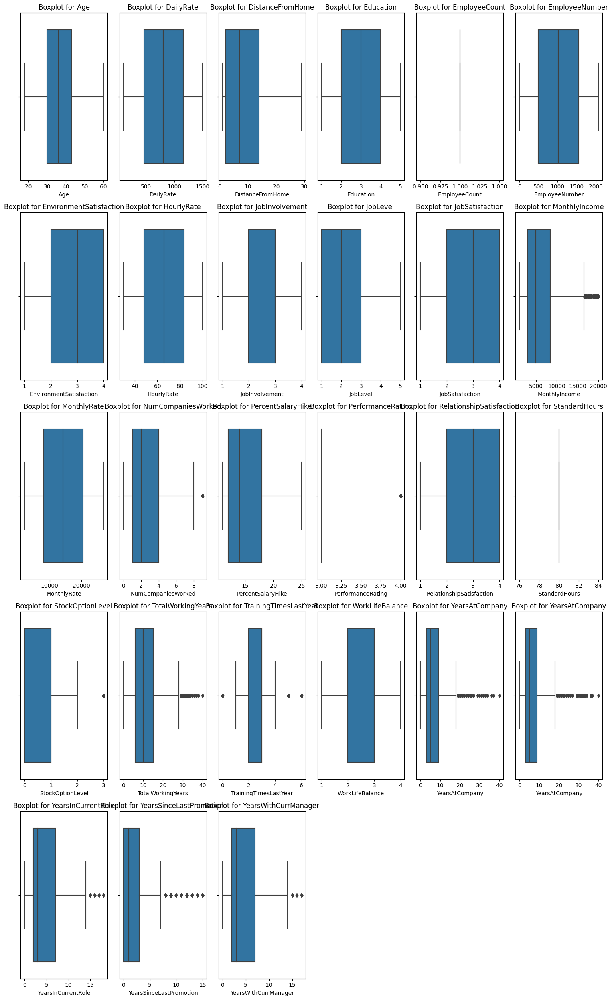

In [10]:
n_cols = 6
n_rows = -(-len(int_data) // n_cols)  

plt.figure(figsize=(15, n_rows * 5))  

for i, col in enumerate(int_data):
    plt.subplot(n_rows, n_cols, i + 1)  
    sns.boxplot(data=ibm_data, x=col)
    plt.title(f"Boxplot for {col}")

plt.tight_layout() 
plt.show()

In [11]:
ibm_data.describe(include="object")

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
count,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,6,2,9,3,1,2
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,Y,No
freq,1233,1043,961,606,882,326,673,1470,1054


> Missing values

In [12]:
ibm_data.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

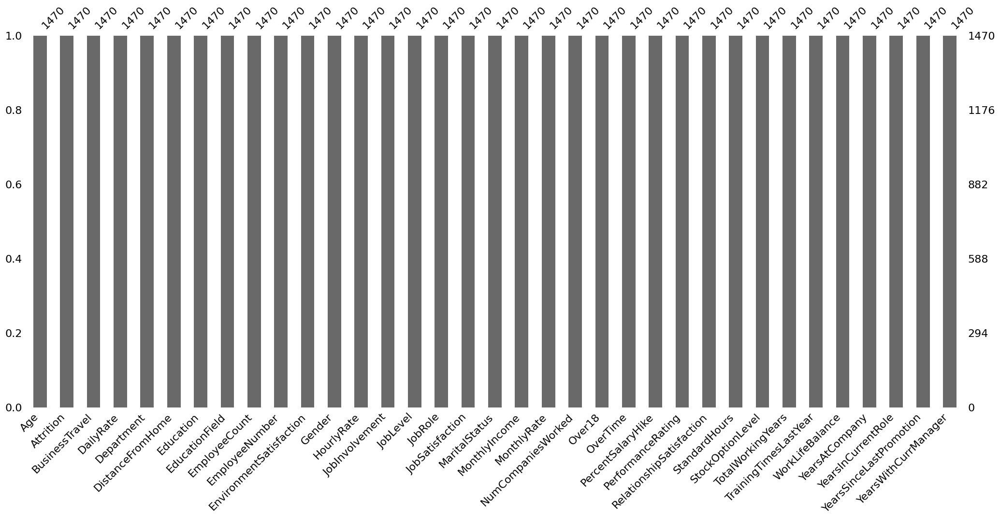

In [13]:
msno.bar(ibm_data)
plt.show()

In [14]:
for i in ibm_data:
    print(f"count value to  {ibm_data[i].value_counts()}\n {'-'*50}")

count value to  Age
35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: count, dtype: int64
 --------------------------------------------------
count value to  Attrition
No     1233
Yes     237
Name: count, dtype: int64
 --------------------------------------------------
count value to  BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64
 --------------------------------------------------
count value to  DailyRate
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: count, Length: 886, dtype: int64
 ------------------------

In [15]:
bar_data=["Attrition","BusinessTravel","Department","Education","EducationField","Gender","JobInvolvement","JobLevel"
             ,"JobRole","JobSatisfaction","OverTime","RelationshipSatisfaction"]
scatter_data=["Age","DailyRate","DistanceFromHome","HourlyRate","MonthlyRate","MonthlyIncome","TotalWorkingYears","TrainingTimesLastYear","YearsAtCompany","YearsInCurrentRole"]
def plot(col):
    plt.figure(figsize=(20,20))
    for i,coll in enumerate(bar_data):
        if coll!= col:
            plt.subplot(4,3,1+i)
            sns.countplot(data=ibm_data,x=col,hue=coll)
            plt.title(f"Count Plot for {col}")
            plt.xticks(rotation=90)  
    plt.tight_layout()  
    plt.show()
    
    plt.figure(figsize=(25,10))
    for i,coll in enumerate(scatter_data):
        if coll!= col:
            plt.subplot(2,5,1+i)
            sns.scatterplot(data=ibm_data,x=col,y=coll)
            plt.title(f"Scatter Plot for {col} vs {coll}")
            plt.xticks(rotation=90)  
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(25,10))
    for i,coll in enumerate(scatter_data):
        if coll!= col:
            plt.subplot(2,5,1+i)
            sns.lineplot(data=ibm_data,x=col,y=coll)
            plt.title(f"Line Plot for {col} vs {coll}")
            plt.xticks(rotation=90)  
    plt.tight_layout()
    plt.show()

In [16]:
def plot_pie_and_bar(col):
    plt.figure(figsize=(16, 6))
    
    # Pie Chart
    plt.subplot(1, 2, 1)
    ibm_data[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
    plt.title(f"Pie Chart for {col}")
    
    # Bar Chart
    plt.subplot(1, 2, 2)
    sns.countplot(data=ibm_data, x=col, palette="pastel")
    plt.title(f"Bar Plot for {col}")
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

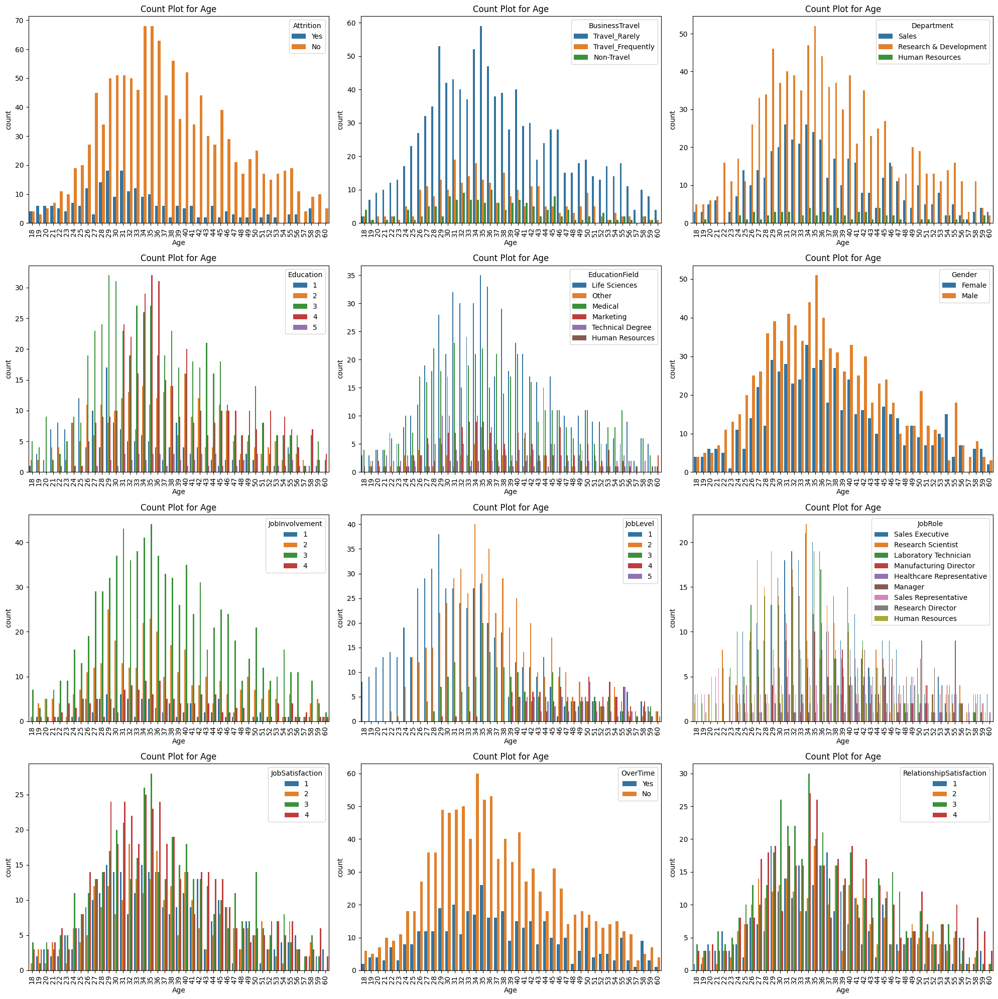

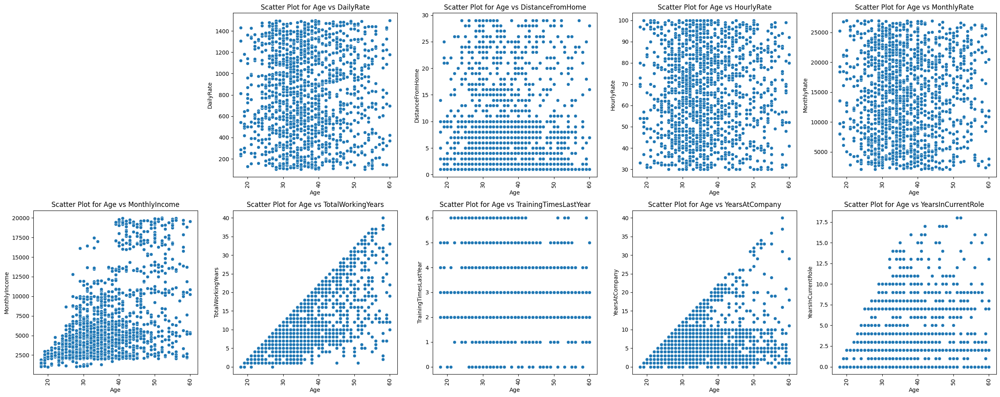

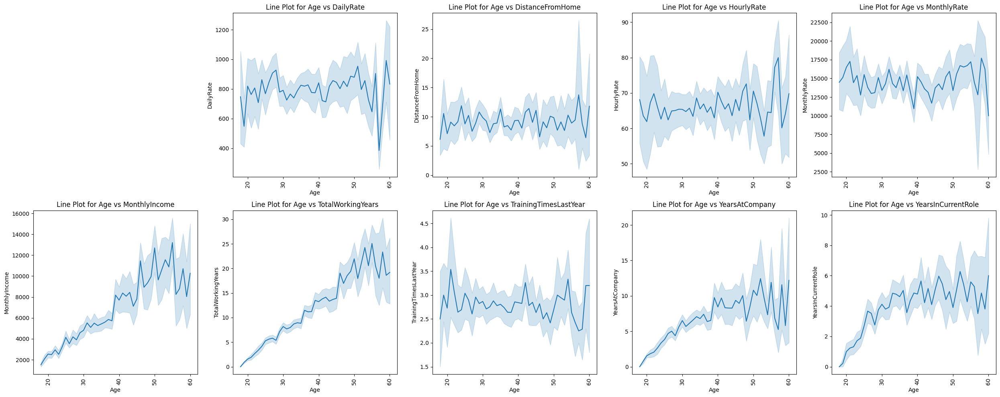

In [17]:
plot("Age")


************************************************** The pie and bar of Attrition **************************************************



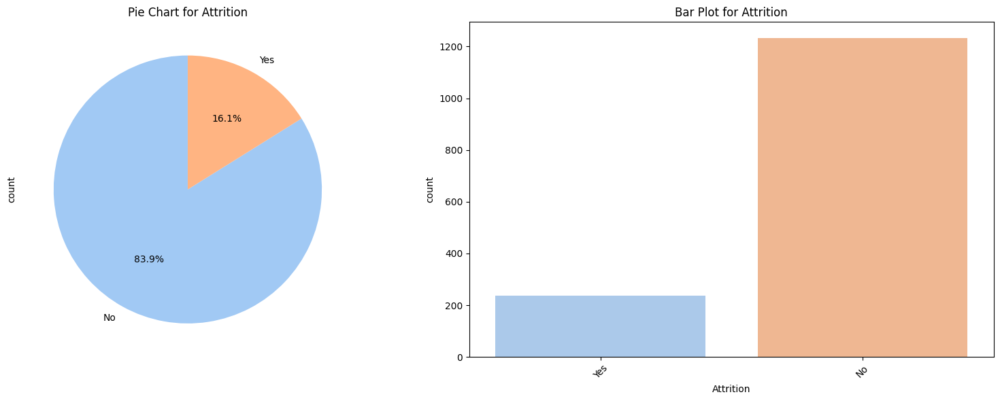


-------------------------------------------------- The chart of Attrition --------------------------------------------------



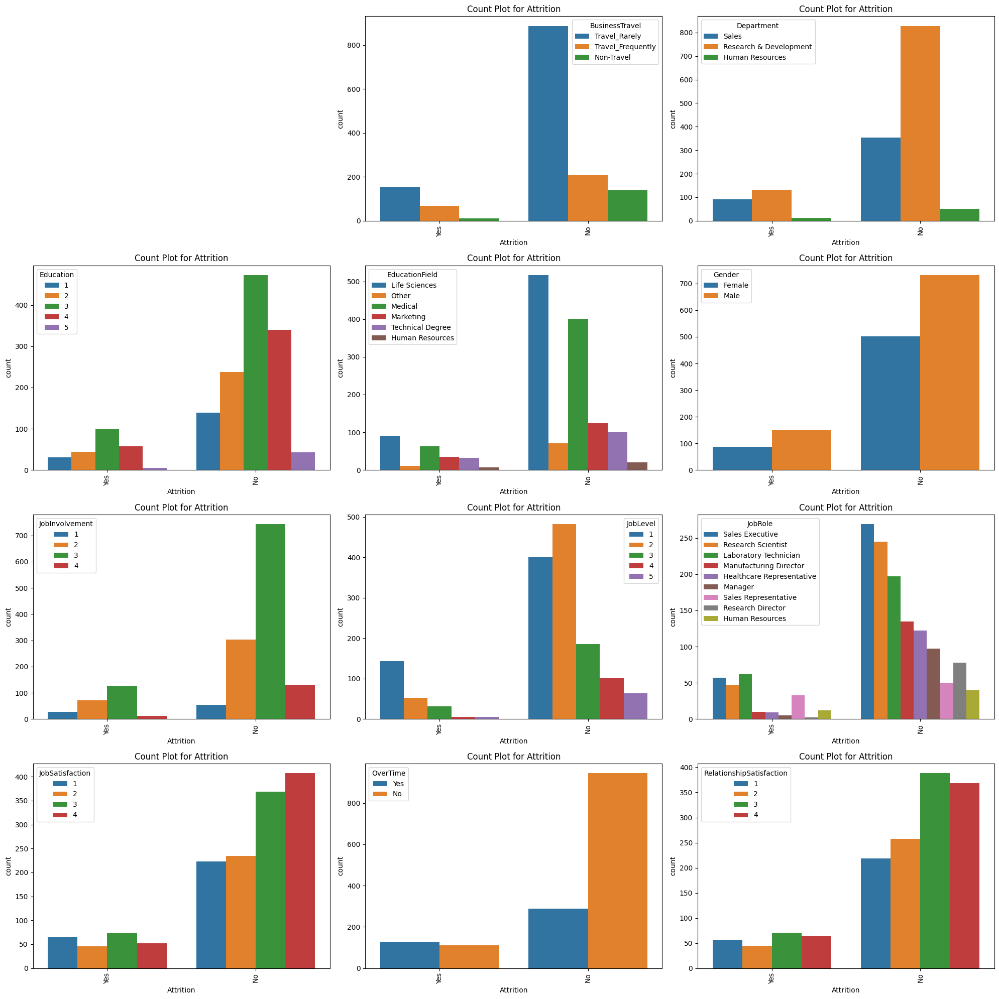

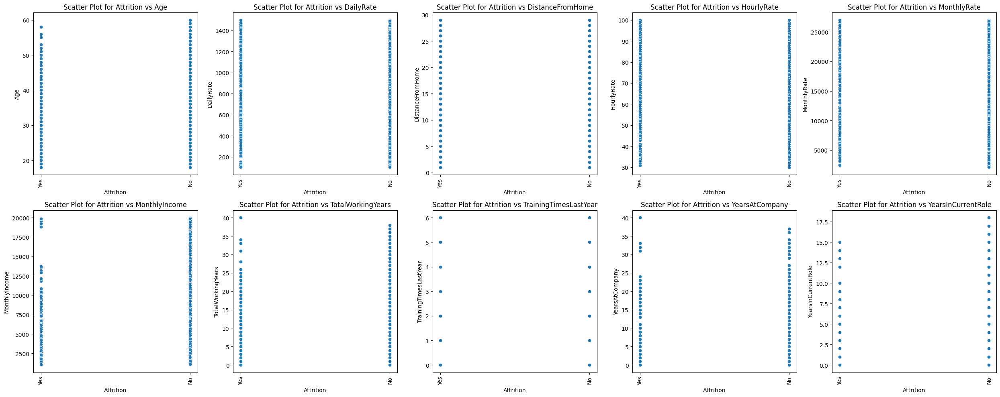

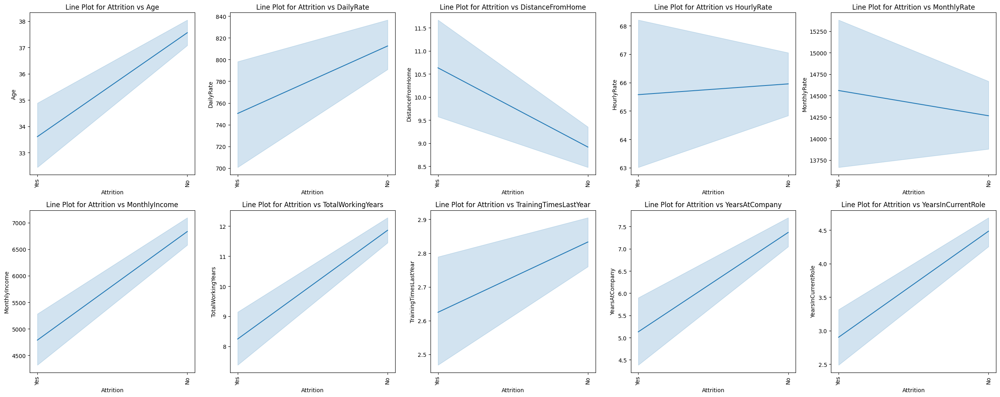


************************************************** The pie and bar of BusinessTravel **************************************************



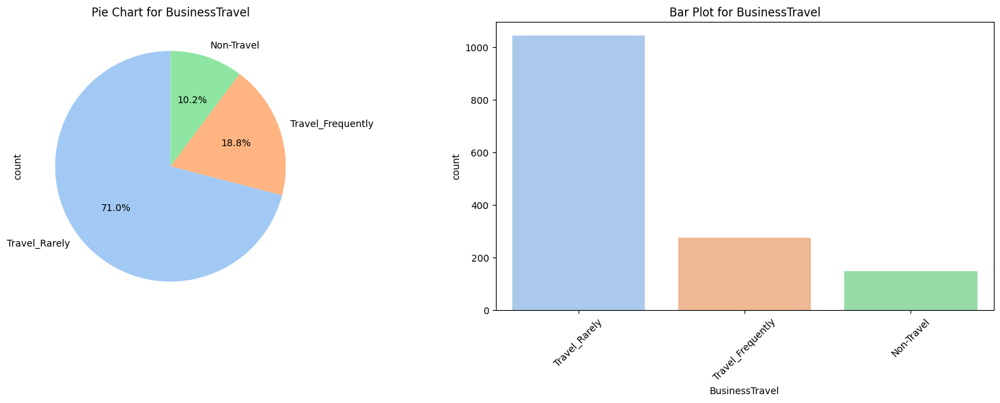


-------------------------------------------------- The chart of BusinessTravel --------------------------------------------------



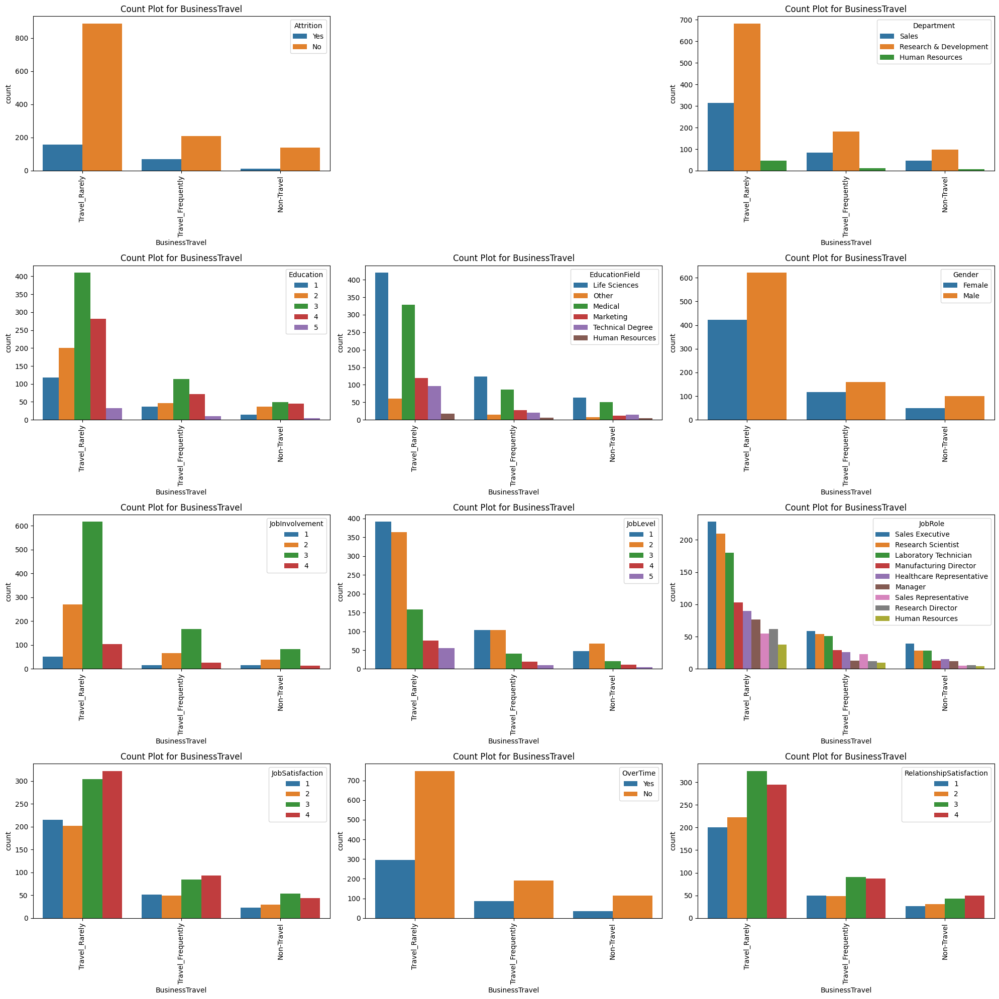

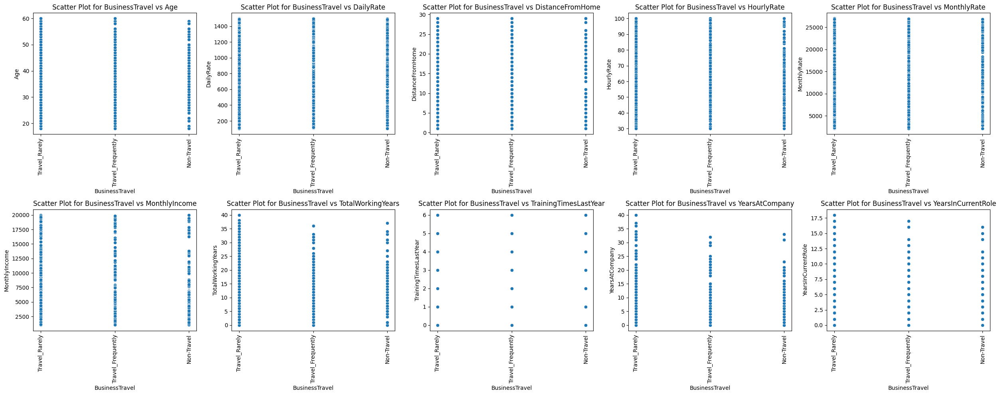

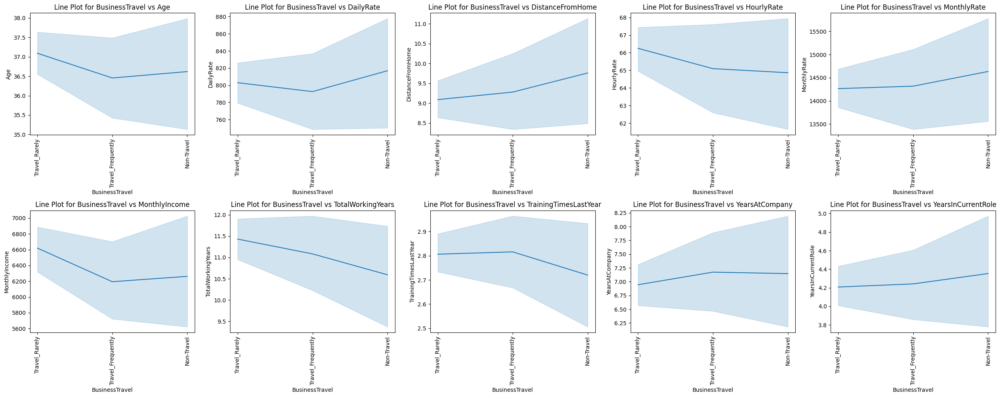


************************************************** The pie and bar of Department **************************************************



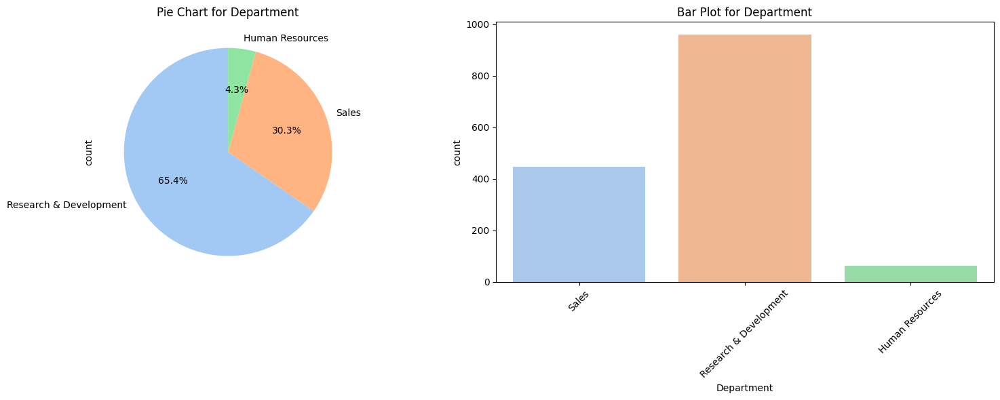


-------------------------------------------------- The chart of Department --------------------------------------------------



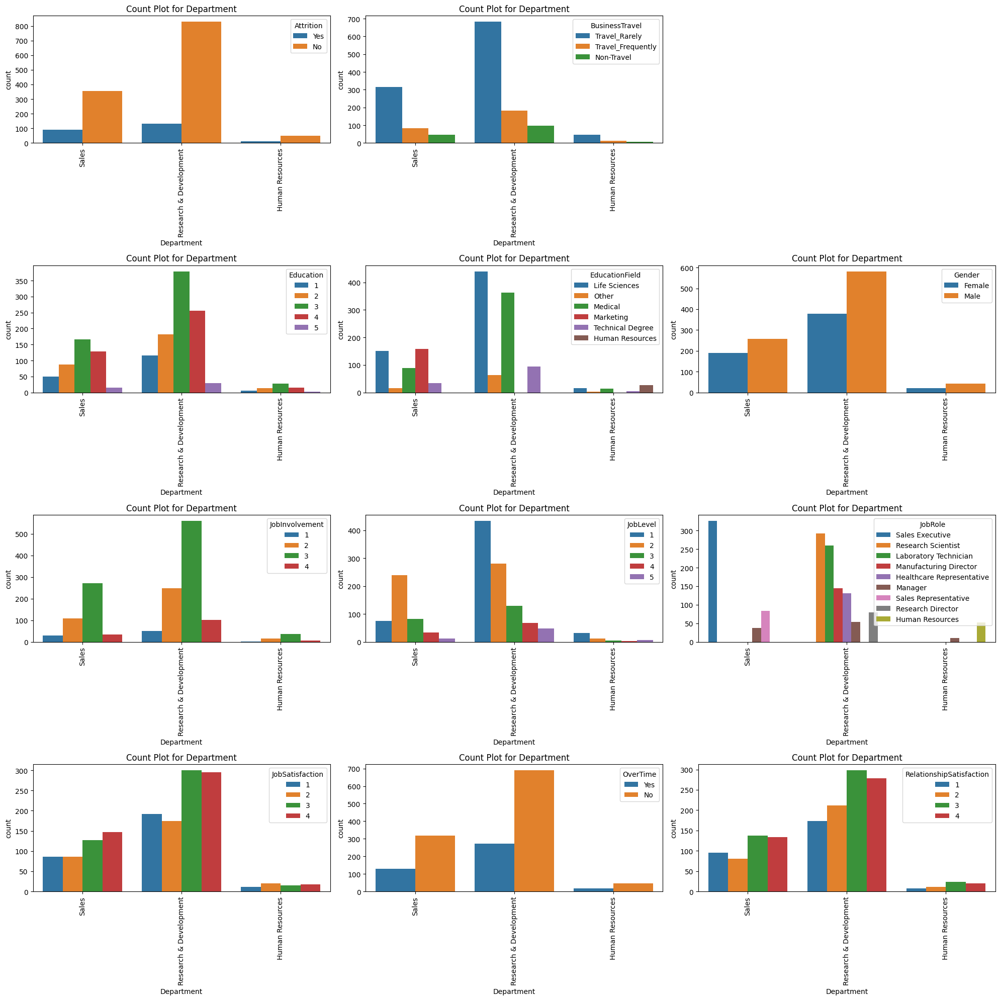

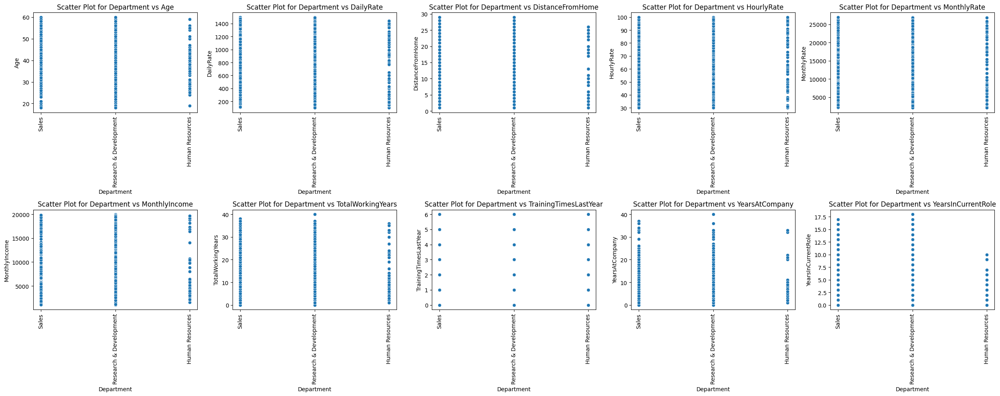

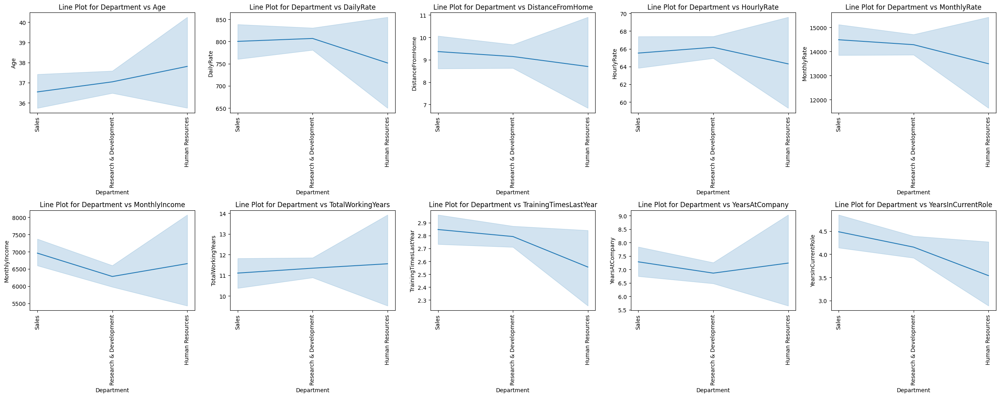


************************************************** The pie and bar of Education **************************************************



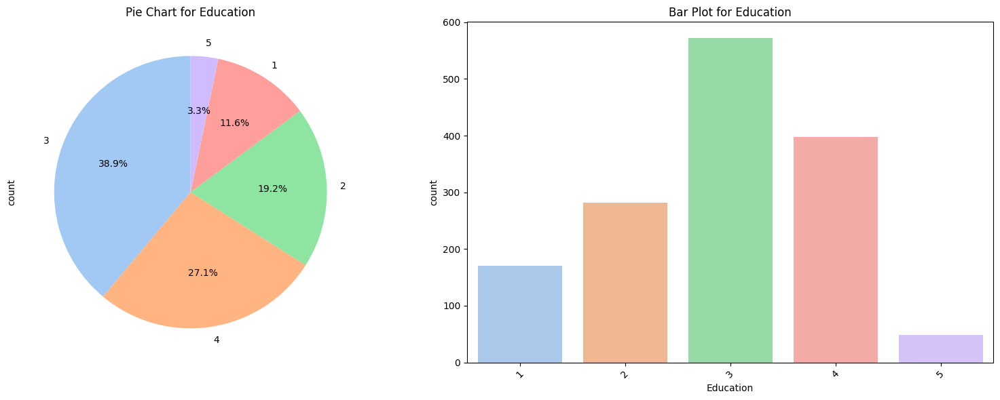


-------------------------------------------------- The chart of Education --------------------------------------------------



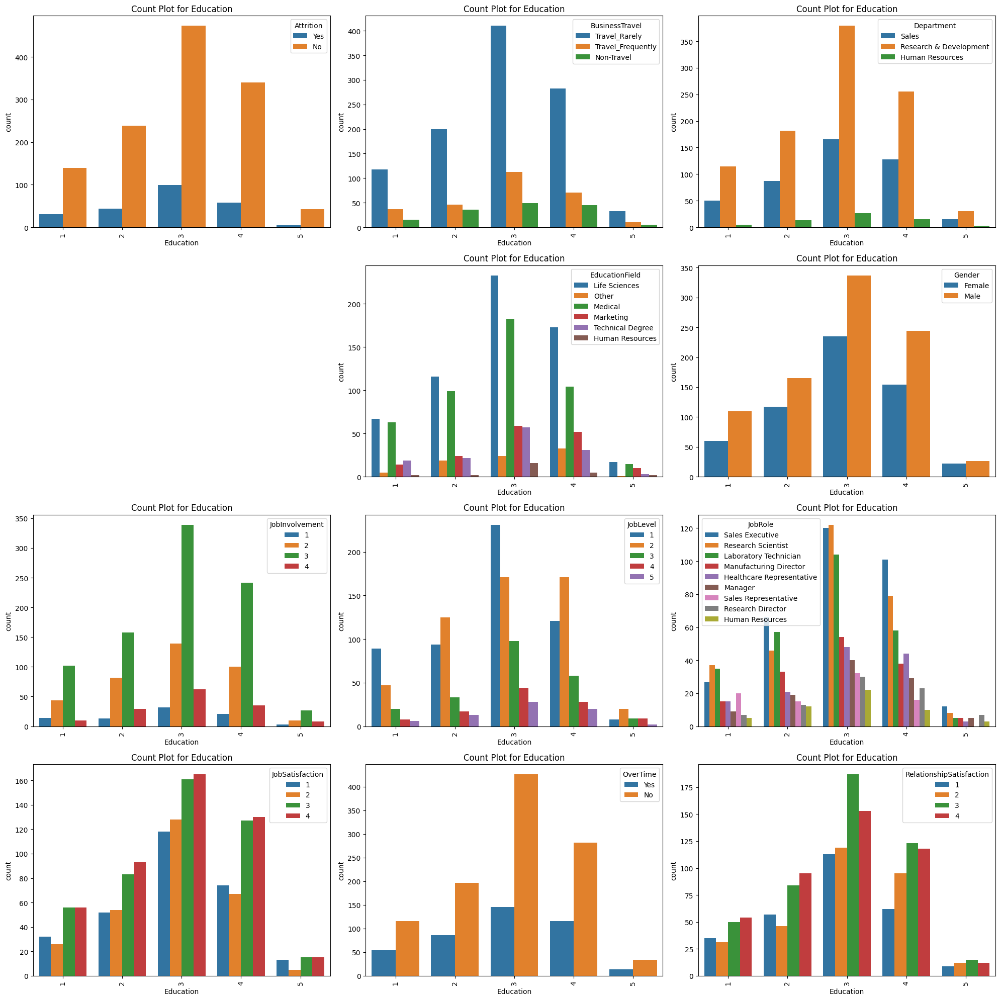

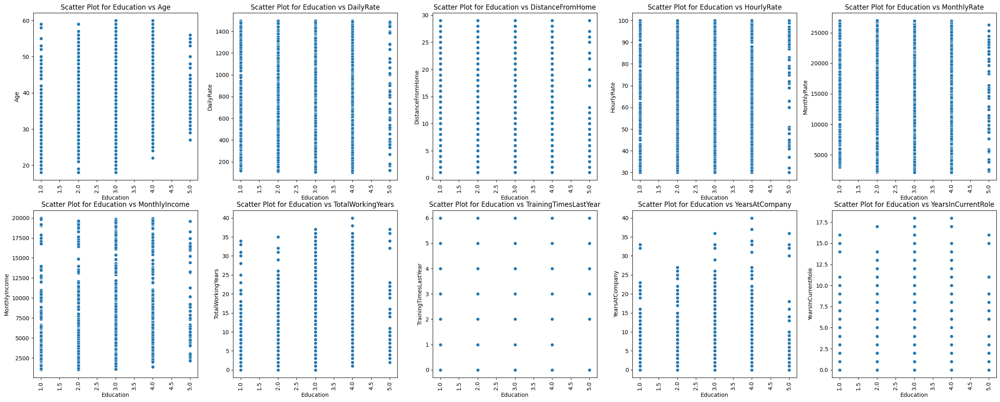

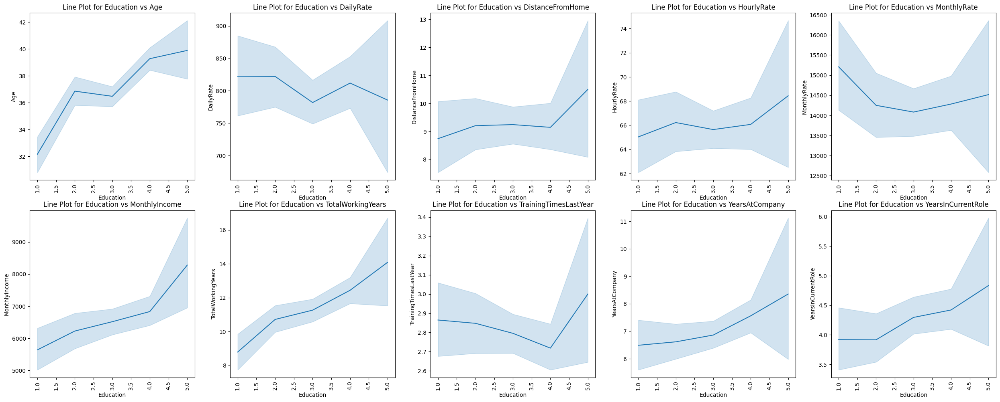


************************************************** The pie and bar of EducationField **************************************************



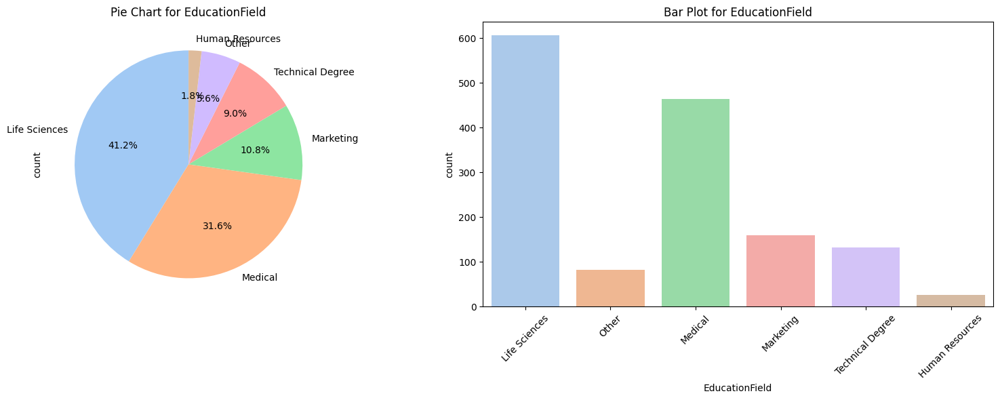


-------------------------------------------------- The chart of EducationField --------------------------------------------------



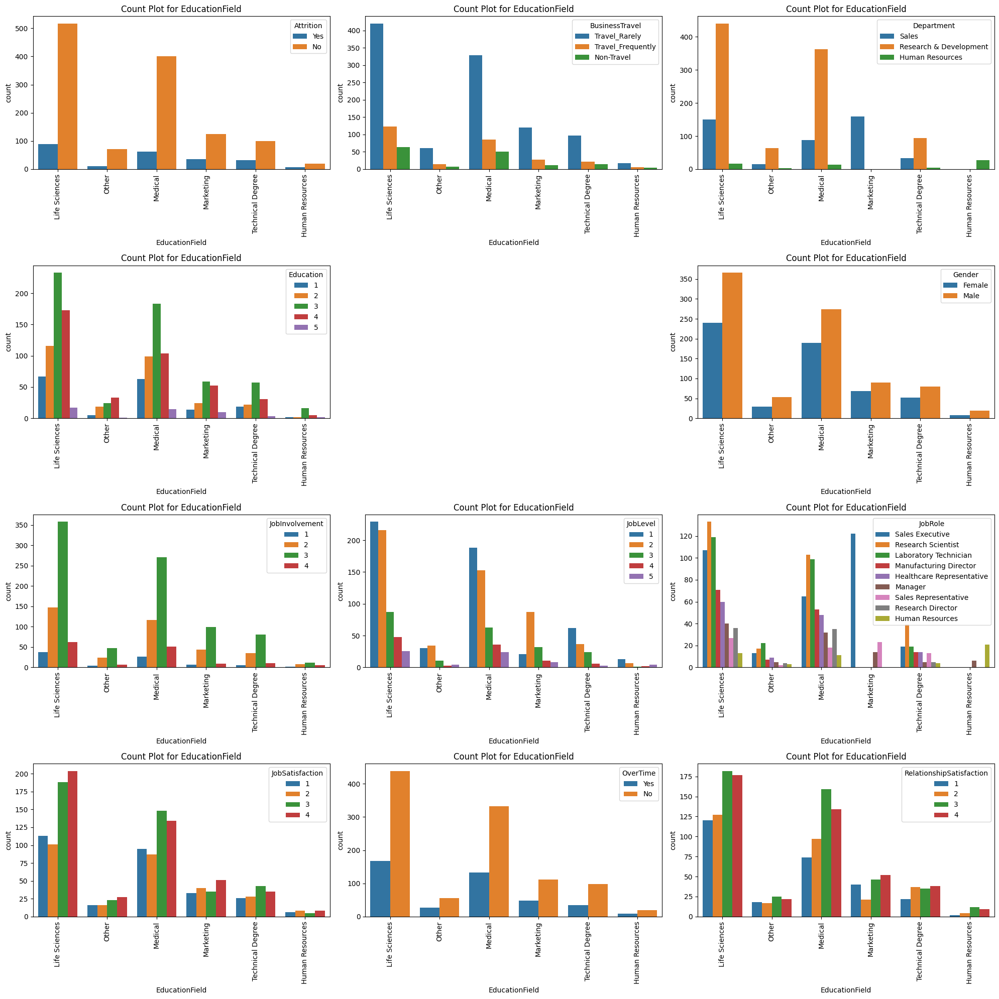

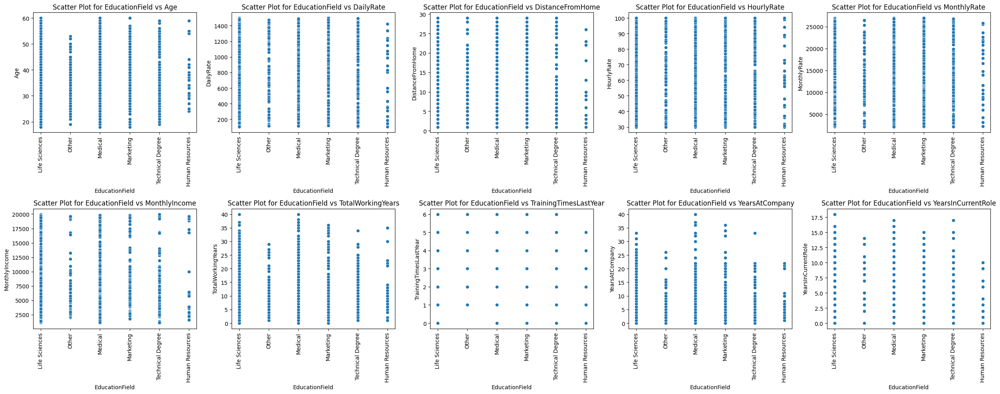

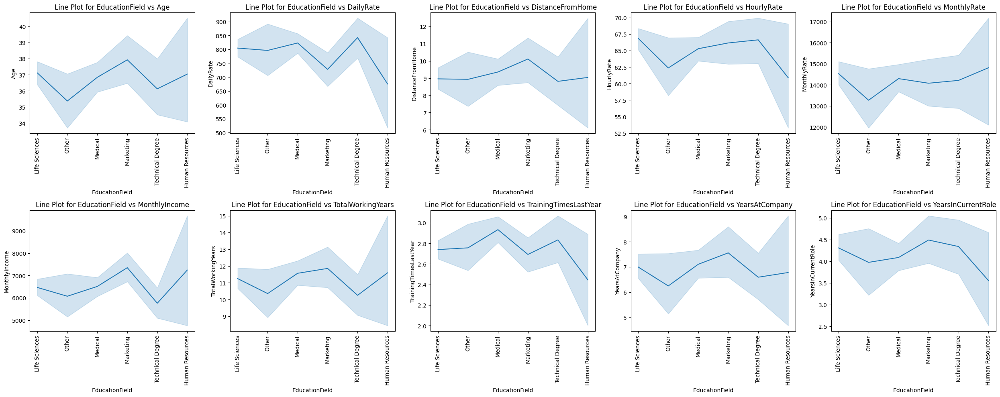


************************************************** The pie and bar of Gender **************************************************



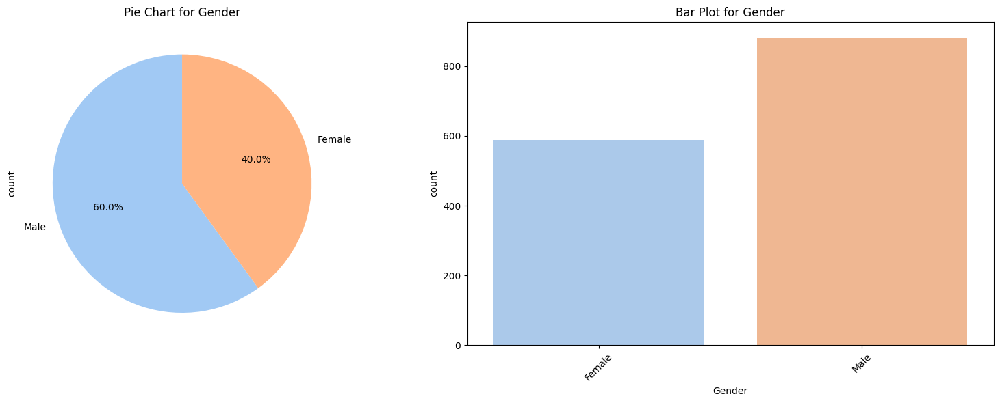


-------------------------------------------------- The chart of Gender --------------------------------------------------



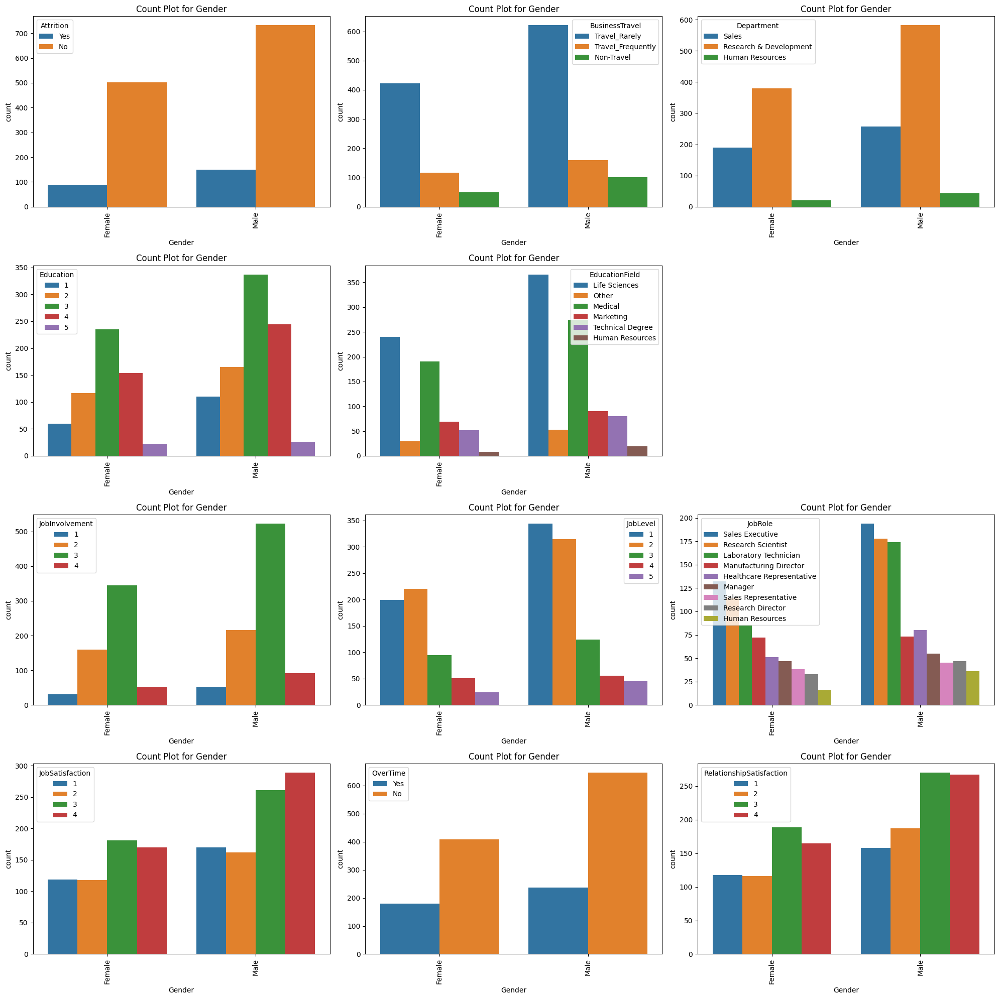

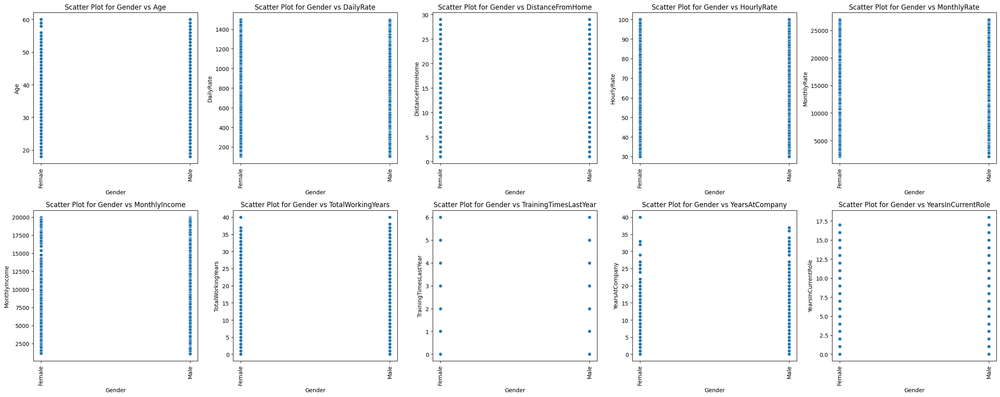

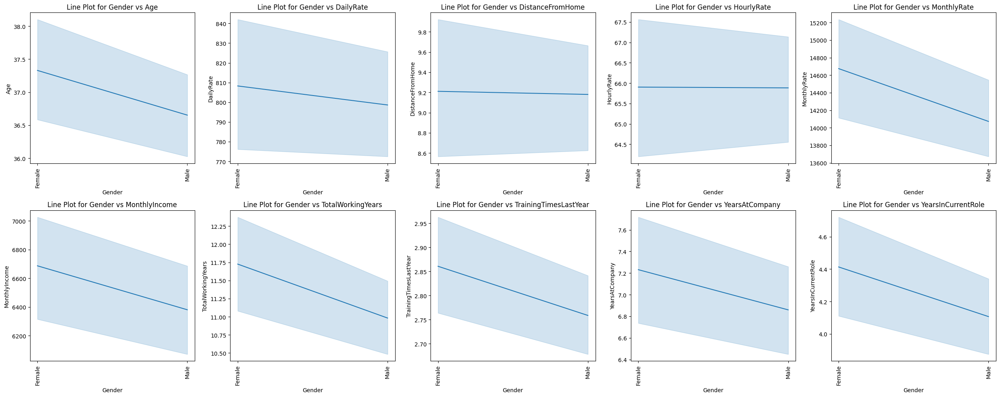


************************************************** The pie and bar of JobInvolvement **************************************************



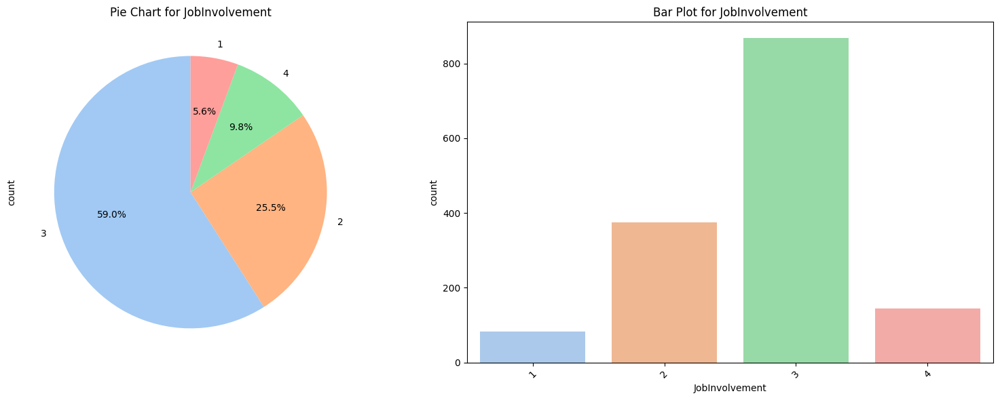


-------------------------------------------------- The chart of JobInvolvement --------------------------------------------------



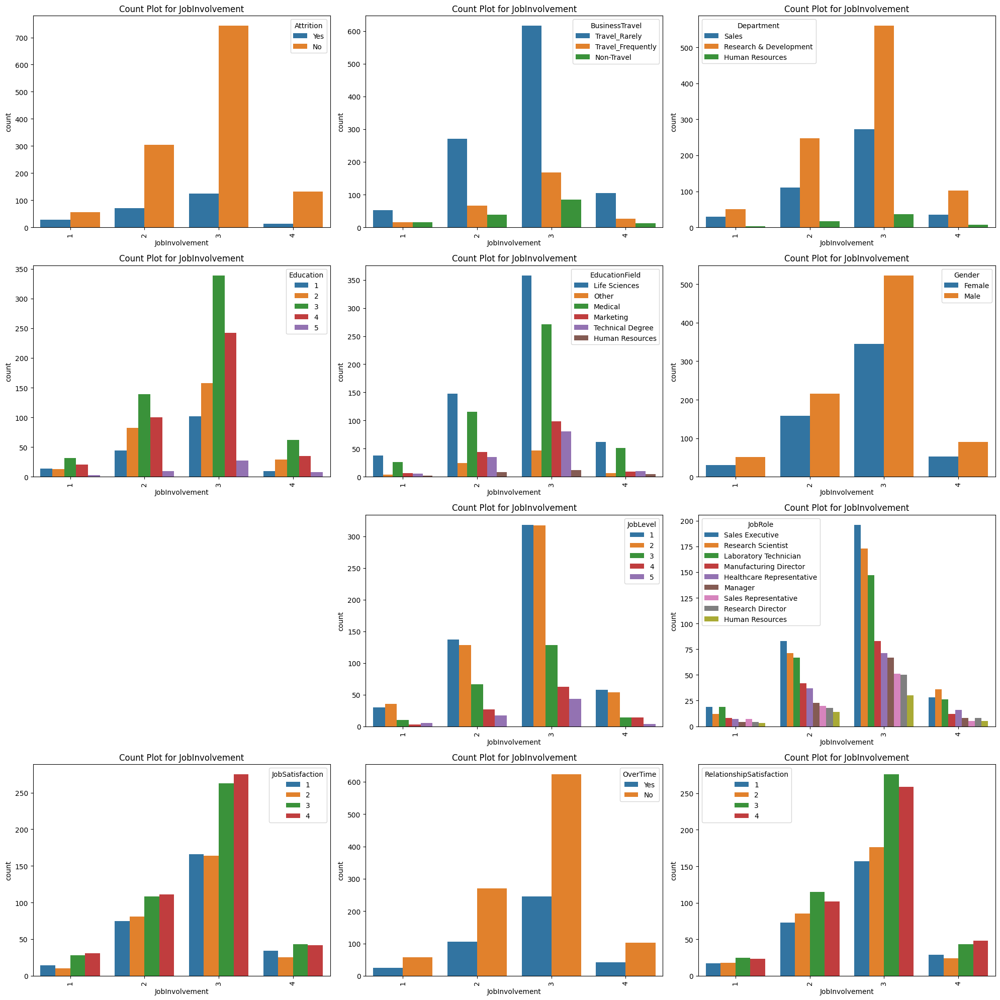

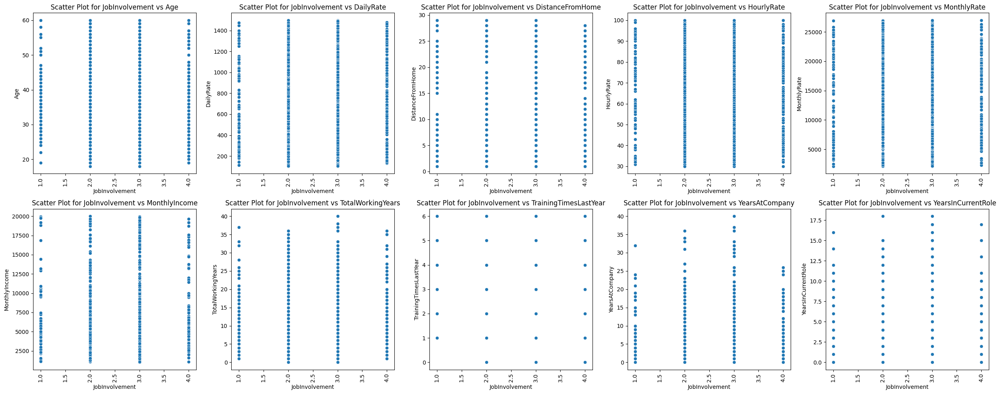

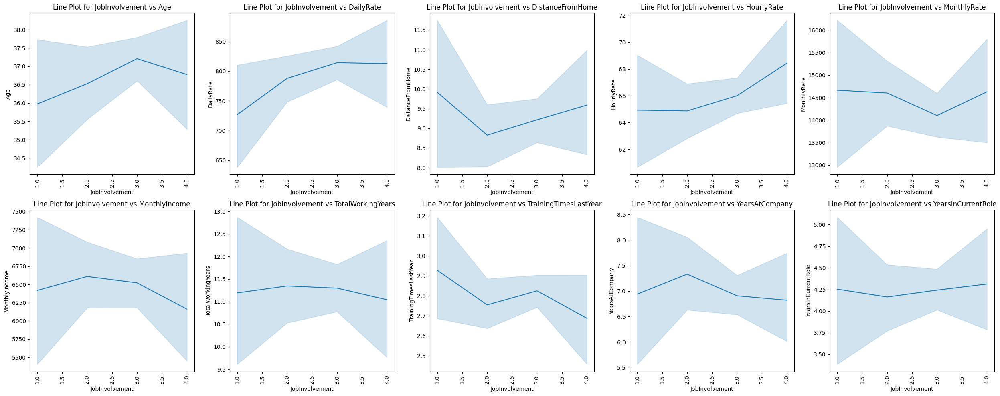


************************************************** The pie and bar of JobLevel **************************************************



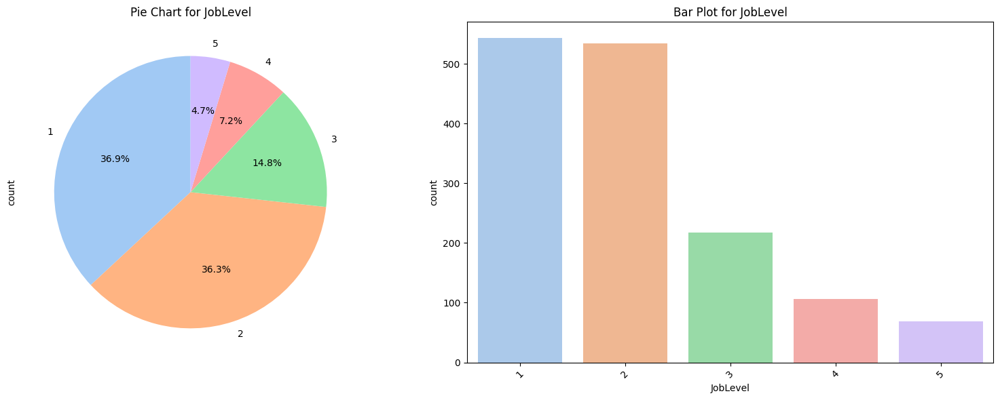


-------------------------------------------------- The chart of JobLevel --------------------------------------------------



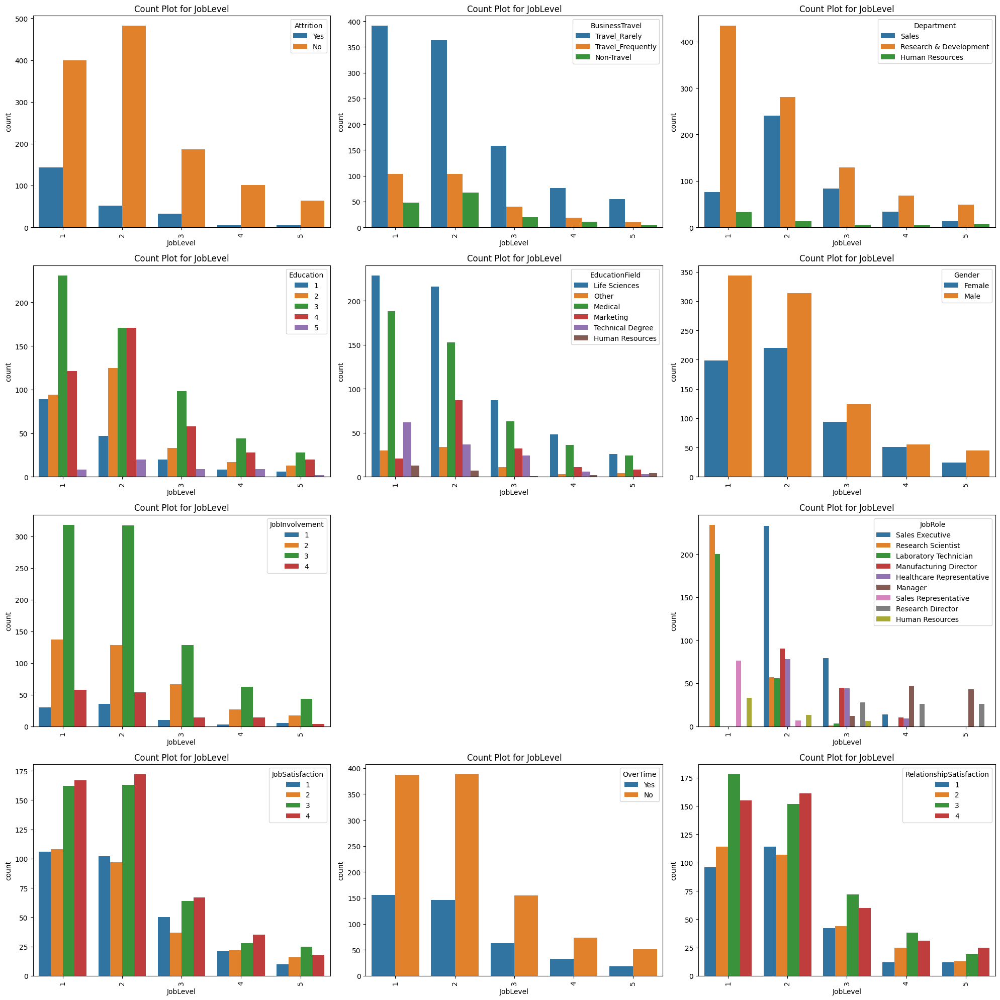

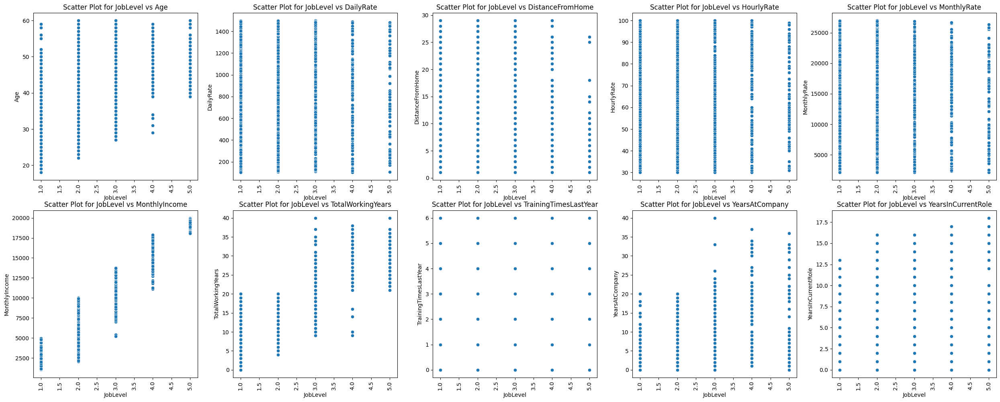

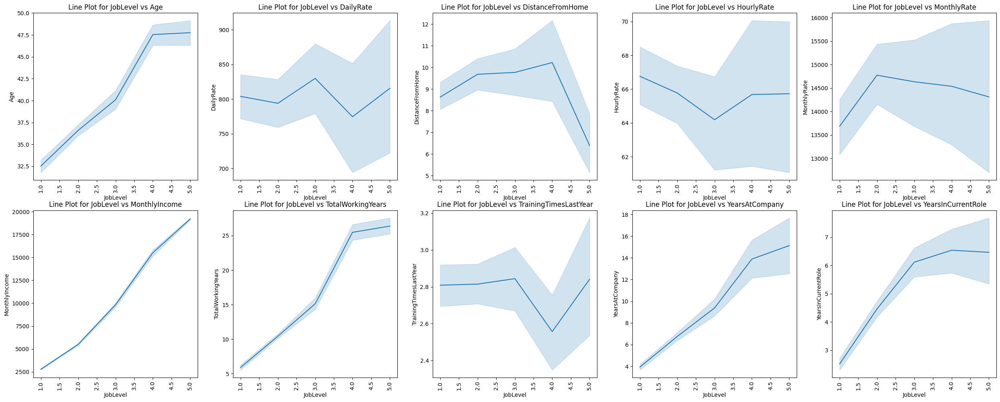


************************************************** The pie and bar of JobRole **************************************************



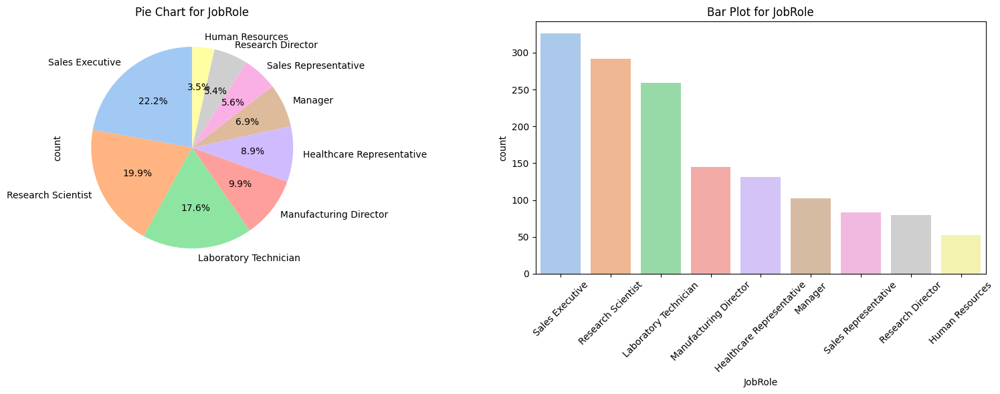


-------------------------------------------------- The chart of JobRole --------------------------------------------------



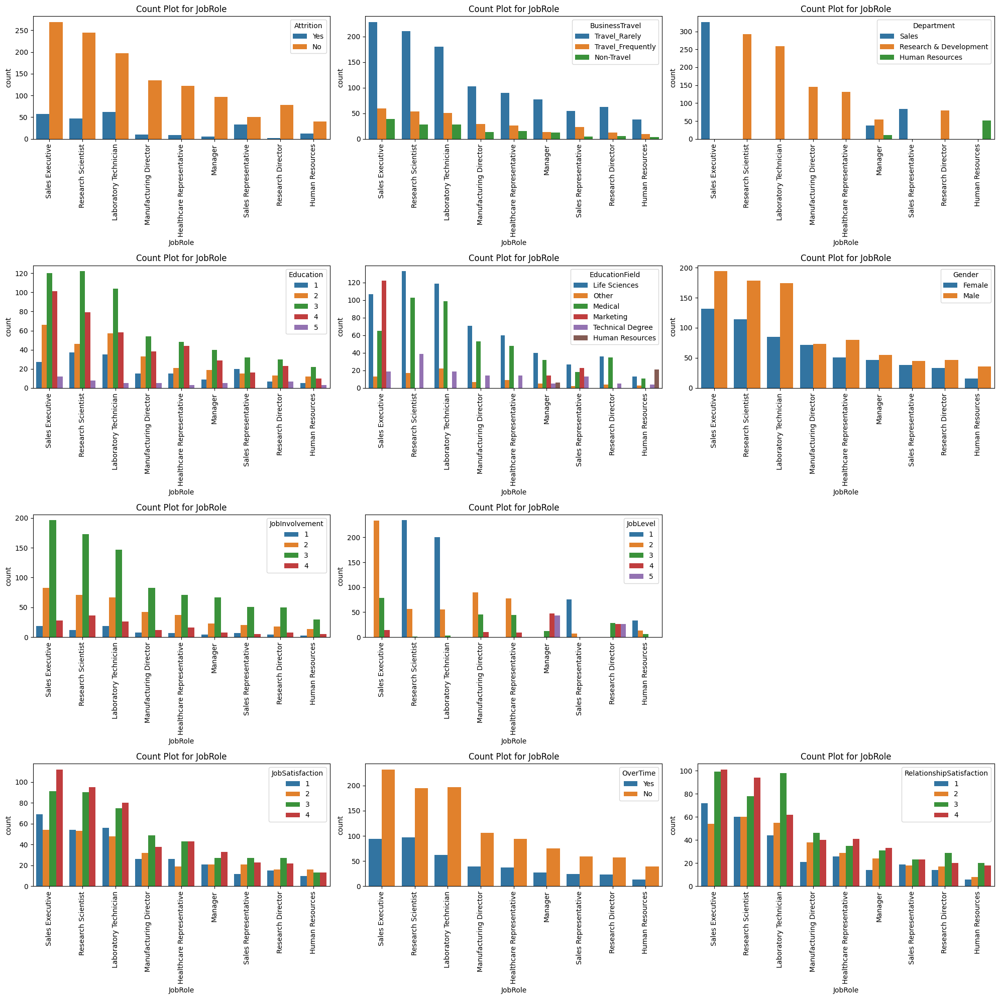

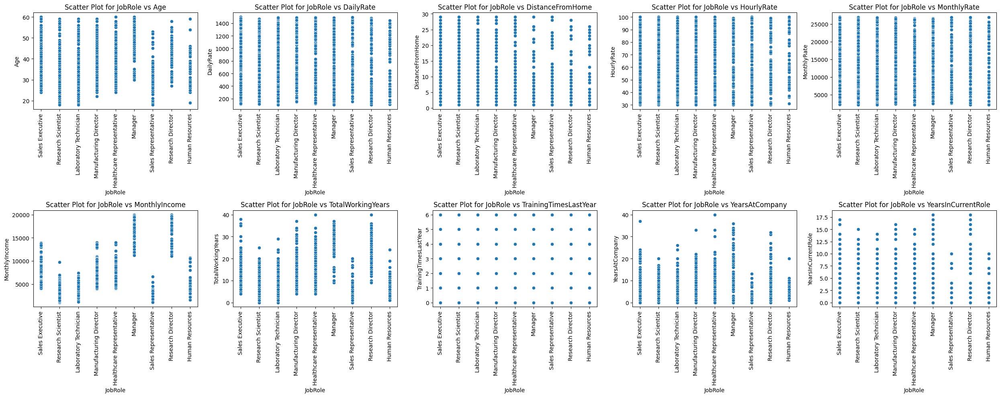

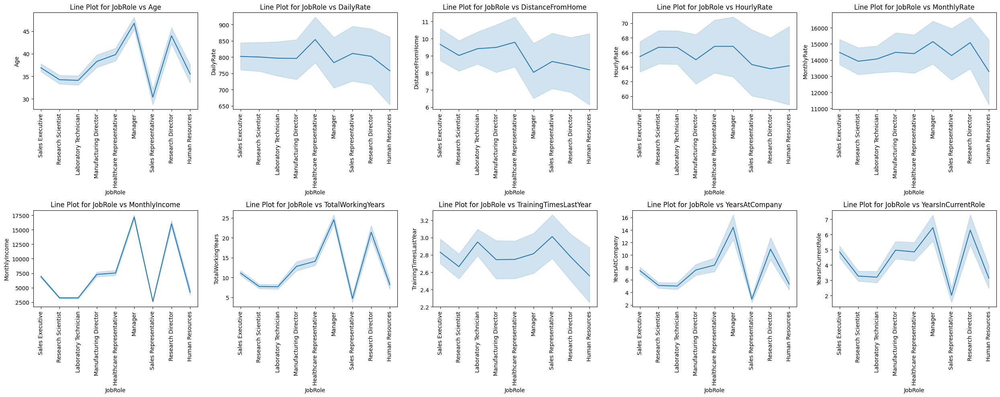


************************************************** The pie and bar of JobSatisfaction **************************************************



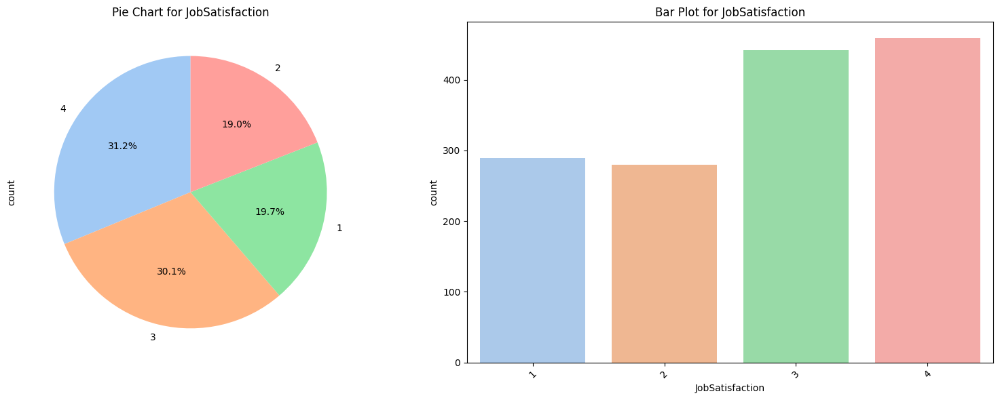


-------------------------------------------------- The chart of JobSatisfaction --------------------------------------------------



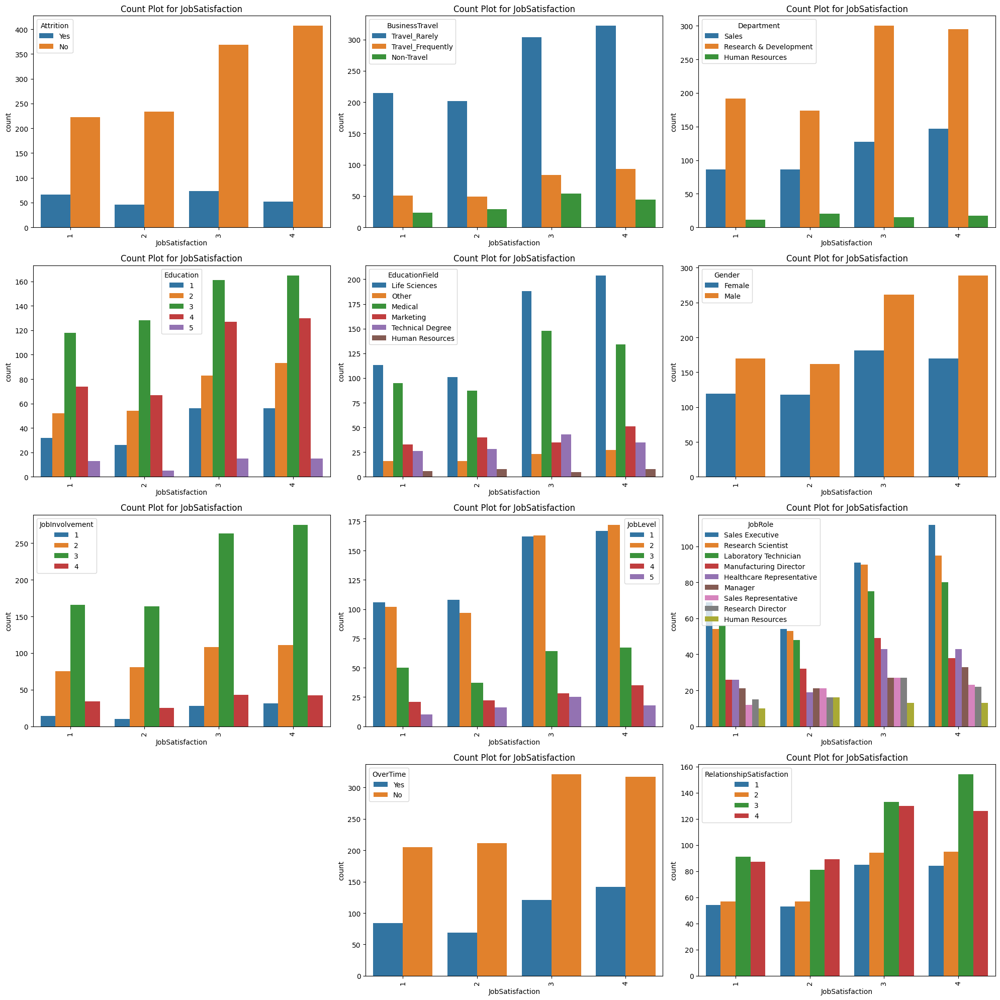

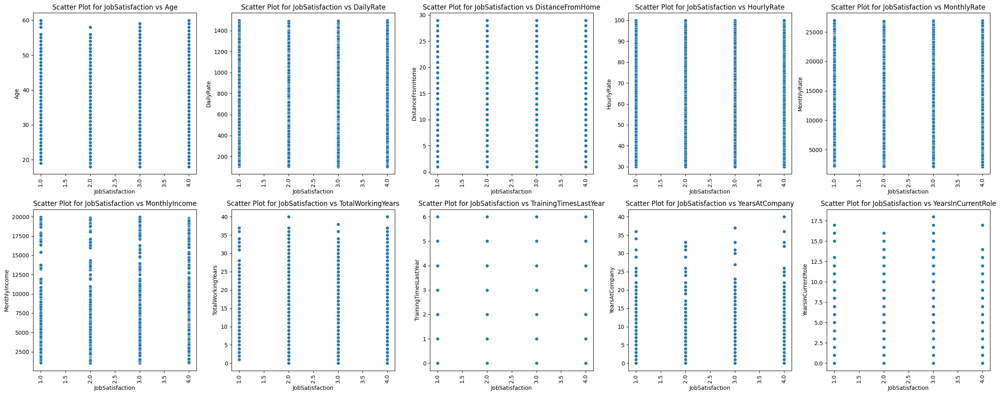

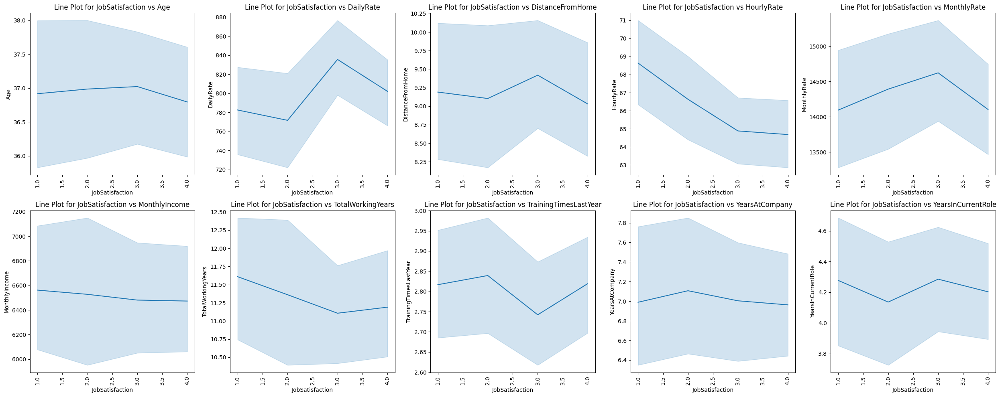


************************************************** The pie and bar of OverTime **************************************************



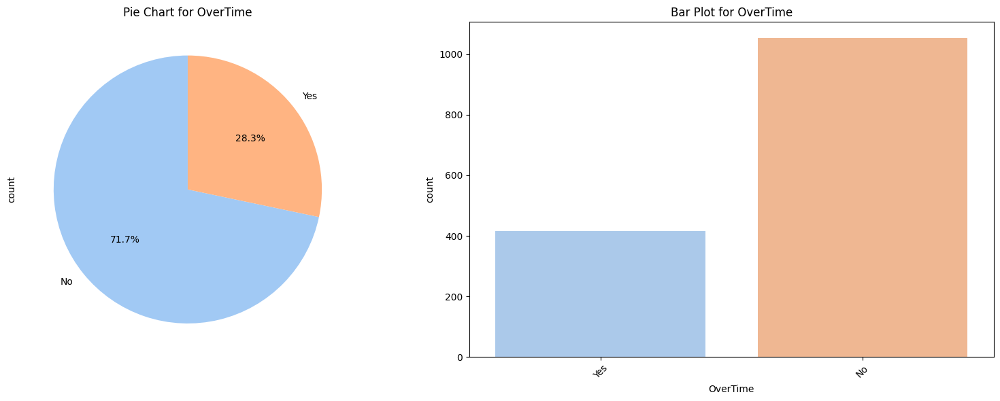


-------------------------------------------------- The chart of OverTime --------------------------------------------------



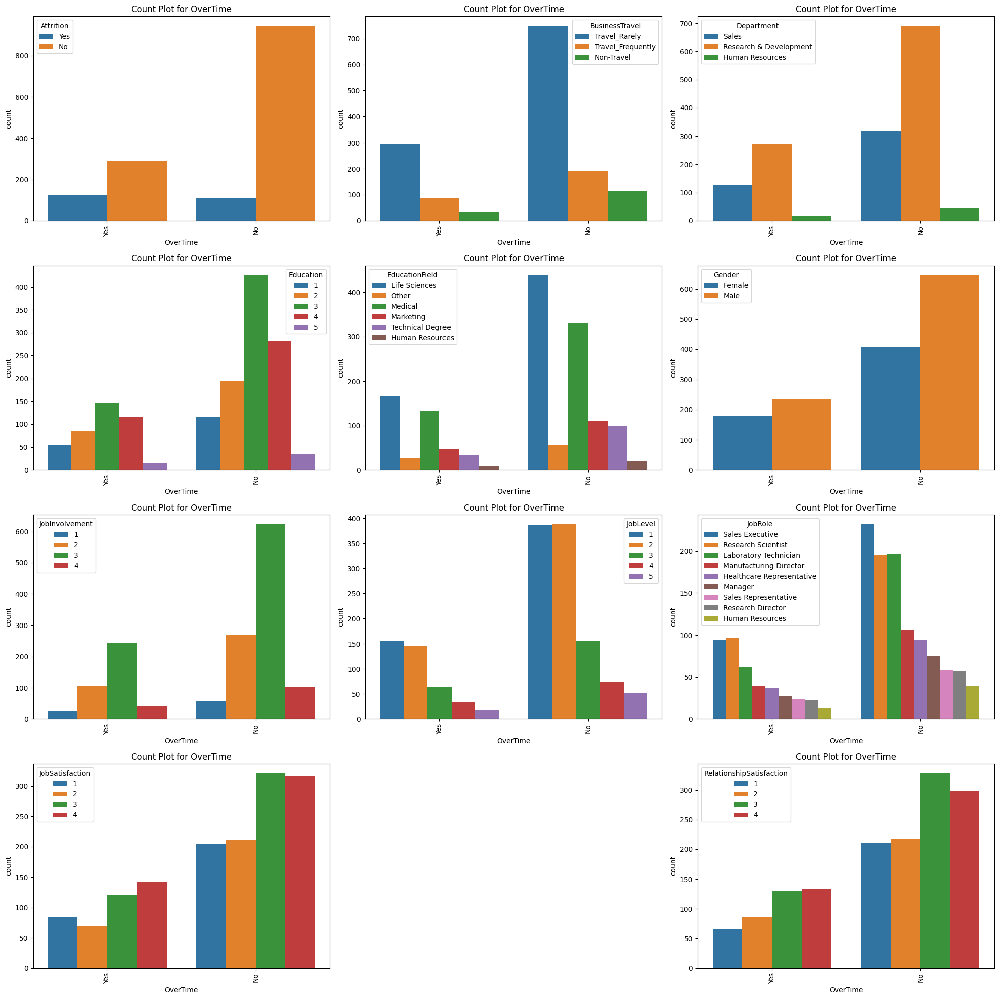

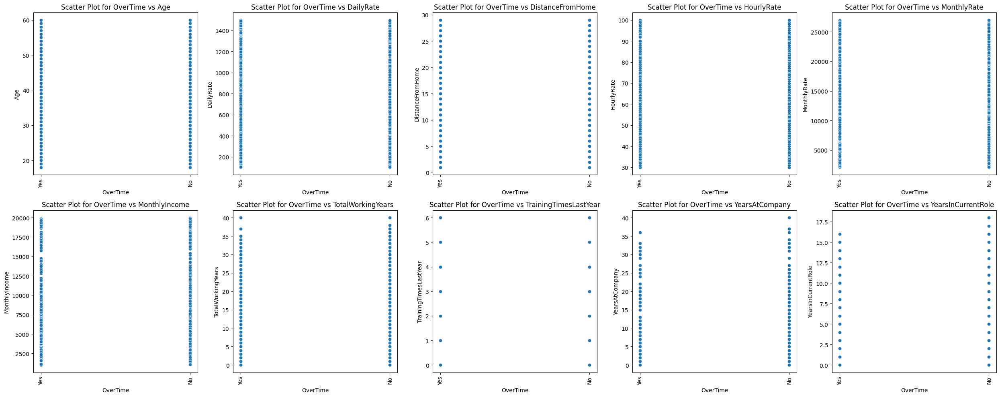

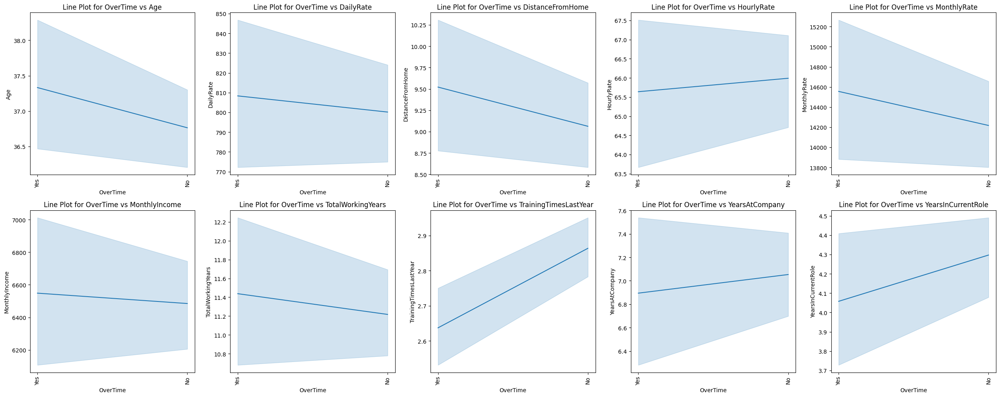


************************************************** The pie and bar of RelationshipSatisfaction **************************************************



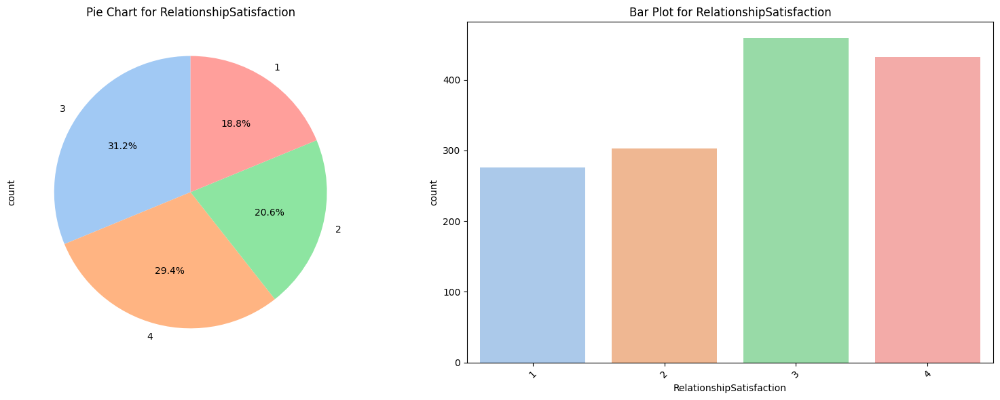


-------------------------------------------------- The chart of RelationshipSatisfaction --------------------------------------------------



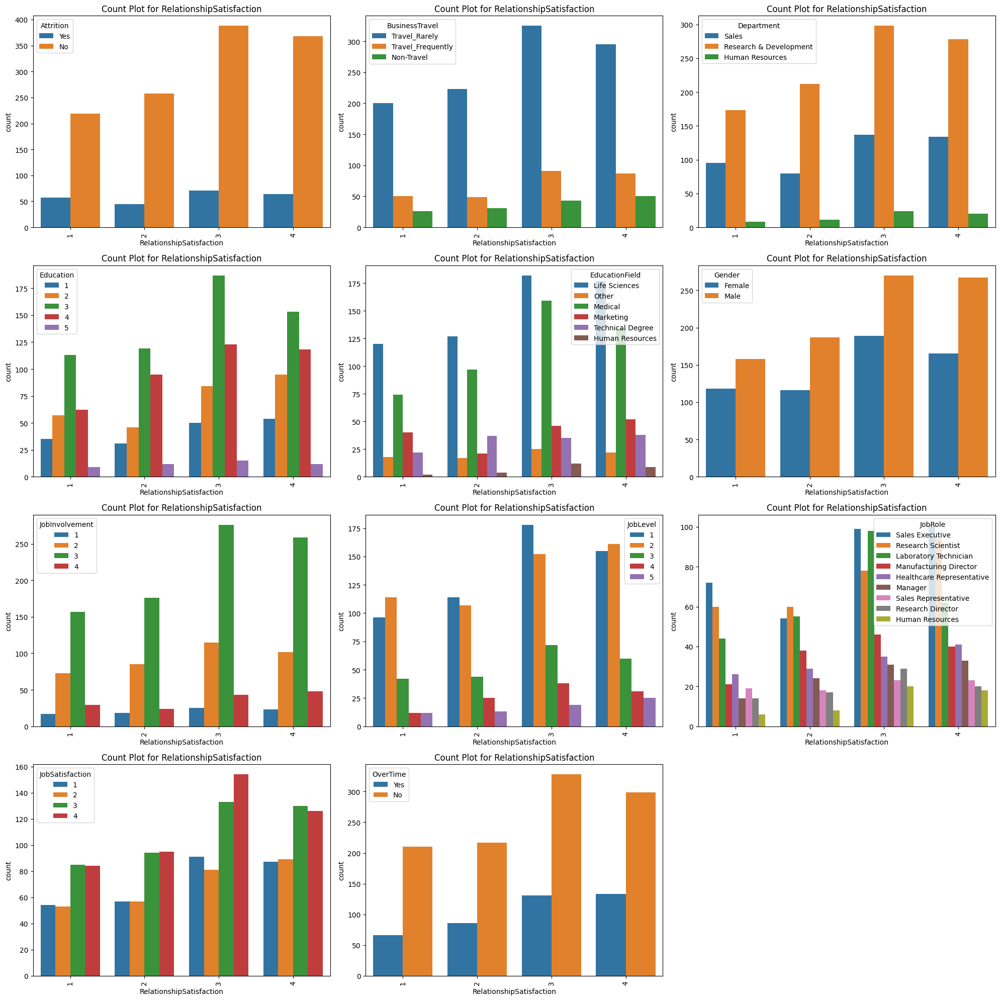

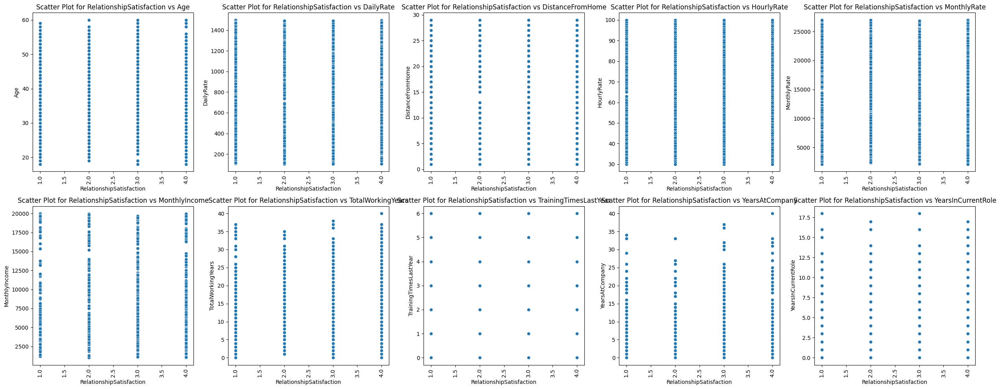

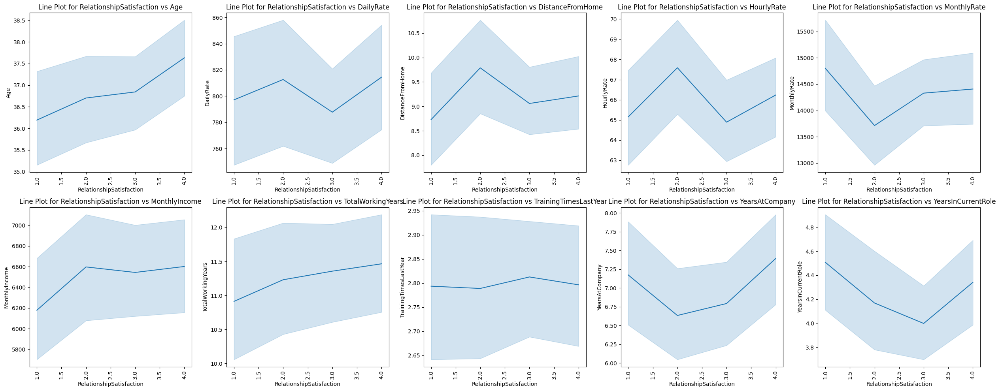

In [18]:
for i in bar_data:
    print(f"\n{'*'*50} The pie and bar of {i} {'*'*50}\n")
    plot_pie_and_bar(i)
    print(f"\n{'-'*50} The chart of {i} {'-'*50}\n")
    plot(i)

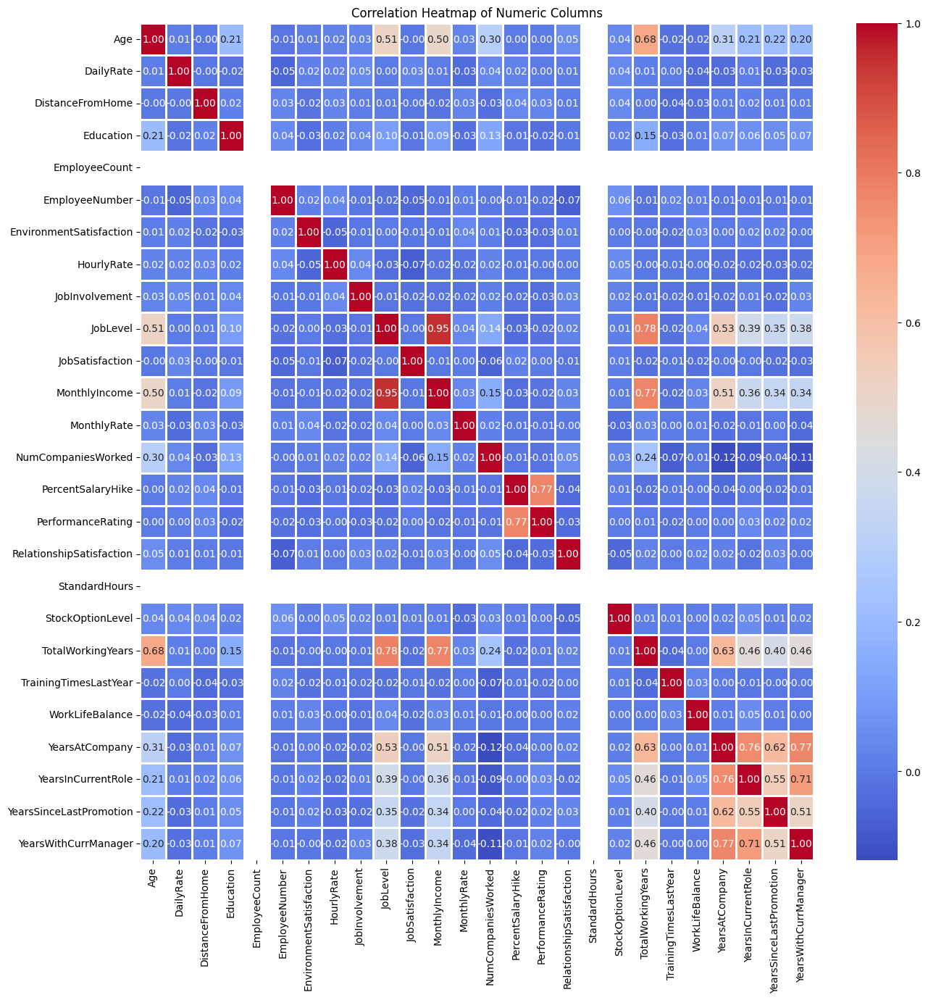

In [26]:
numeric_data = ibm_data.select_dtypes(include=['float64', 'int64'])
corr = numeric_data.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=1)
plt.title("Correlation Heatmap of Numeric Columns")
plt.show()